# HISTORY

#### Context
* It is often difficult to conduct any kind of machine learning experiment on lunar images because of their scarcity and lack of annotation. The goal of this dataset is to provide the general public with a sample of artificial yet realistic lunar landscapes, which can be used to train rock detection algorithms. Those trained algorithms can then be tested on actual lunar pictures or other pictures of rocky terrain.

#### Content
* The dataset currently contains 9,766 realistic renders of rocky lunar landscapes, and their segmented equivalents (the 3 classes are the sky, smaller rocks, and larger rocks). A table of bounding boxes for all larger rocks and processed, cleaned-up ground truth images are also provided. We recommend that users check the "Understanding and Using the Dataset" kernel for additional information and guidelines on how to use the dataset effectively.

#### Acknowledgements
* This dataset was created by Romain Pessia and Genya Ishigami of the Space Robotics Group, Keio University, Japan. The authors also thank Quentin Jodelet, Tokyo Institute of Technology, for his invaluable help.
* To contact the author, please reach out to pessia[at]keio.jp.

* The software used for creating the images and their ground truth is Planetside Software's Terragen.
* The authors used NASA's LRO LOLA Elevation Model as a source of large-scale terrain data.

# PACKAGES AND LIBRARIES

In [1]:
#GENERAL
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
import random
import time

In [2]:
#PATH PROCESS
import os
import os.path
from pathlib import Path
import glob
from scipy.io import loadmat
import nibabel as nib
import csv

In [3]:
#IMAGE PROCESS
from PIL import Image
from keras.preprocessing import image
from keras.preprocessing.image import ImageDataGenerator
import cv2
from keras.applications.vgg16 import preprocess_input, decode_predictions
from keras.preprocessing import image
from skimage.feature import hessian_matrix, hessian_matrix_eigvals
from scipy.ndimage.filters import convolve
from skimage import data, io, filters
import skimage
from skimage.morphology import convex_hull_image, erosion
from IPython import display
from scipy.ndimage import gaussian_filter
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
import matplotlib.patches as patches

C:\Users\mikip\AppData\Local\Temp\ipykernel_13256\3753352574.py:9: DeprecationWarning: Please use `convolve` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import convolve


In [4]:
#SCALER & TRANSFORMATION
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from keras import regularizers
from sklearn.preprocessing import LabelEncoder

In [5]:
#ACCURACY CONTROL
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, roc_auc_score, roc_curve
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.metrics import mean_squared_error, r2_score

In [6]:
#OPTIMIZER
from keras.optimizers import RMSprop,Adam,Optimizer,Optimizer, SGD

In [7]:
#MODEL LAYERS
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D, BatchNormalization,MaxPooling2D,BatchNormalization,\
                        Permute, TimeDistributed, Bidirectional,GRU, SimpleRNN,\
LSTM, GlobalAveragePooling2D, SeparableConv2D, ZeroPadding2D, Convolution2D, ZeroPadding2D,Reshape, Conv2DTranspose,\
LeakyReLU, GaussianNoise, GlobalMaxPooling2D, ReLU, Input, Concatenate
from keras import models
from keras import layers
import tensorflow as tf
from keras.applications import VGG16,VGG19,inception_v3
from keras import backend as K
from keras.utils import plot_model
from keras.datasets import mnist
import keras
from keras.models import Model


#IGNORING WARNINGS
from warnings import filterwarnings
filterwarnings("ignore",category=DeprecationWarning)
filterwarnings("ignore", category=FutureWarning) 
filterwarnings("ignore", category=UserWarning)

# PATH PROCESS

#### MAIN

In [8]:
Ground_PATH = Path("./Moon_Dataset/images/ground/")
Render_PATH = Path("./Moon_Dataset/images/render/")

#### PNG EXPORTING

In [9]:
Ground_PNG = list(Ground_PATH.glob("*.png"))
Render_PNG = list(Render_PATH.glob("*.png"))

In [10]:
print("GROUND LEN: ", len(Ground_PNG))
print("---"*10)
print("RENDER LEN: ", len(Render_PNG))

GROUND LEN:  9766
------------------------------
RENDER LEN:  9766


In [11]:
print("10th GROUND: ",Ground_PNG[8])
print("---"*10)
print("10th RENDER: ",Render_PNG[8])

10th GROUND:  Moon_Dataset\images\ground\ground0009.png
------------------------------
10th RENDER:  Moon_Dataset\images\render\render0009.png


In [12]:
Sorted_Ground = sorted(Ground_PNG)
Sorted_Render = sorted(Render_PNG)

In [13]:
print("10th GROUND: ",Sorted_Ground[8])
print("---"*10)
print("10th RENDER: ",Sorted_Render[8])

10th GROUND:  Moon_Dataset\images\ground\ground0009.png
------------------------------
10th RENDER:  Moon_Dataset\images\render\render0009.png


#### TO SERIES

In [14]:
Ground_SERIES = pd.Series(Sorted_Ground,name="MASK").astype(str)
Render_SERIES = pd.Series(Sorted_Render,name="IMAGE").astype(str)

In [15]:
print(Ground_SERIES.head(-1))

0       Moon_Dataset\images\ground\ground0001.png
1       Moon_Dataset\images\ground\ground0002.png
2       Moon_Dataset\images\ground\ground0003.png
3       Moon_Dataset\images\ground\ground0004.png
4       Moon_Dataset\images\ground\ground0005.png
                          ...                    
9760    Moon_Dataset\images\ground\ground9761.png
9761    Moon_Dataset\images\ground\ground9762.png
9762    Moon_Dataset\images\ground\ground9763.png
9763    Moon_Dataset\images\ground\ground9764.png
9764    Moon_Dataset\images\ground\ground9765.png
Name: MASK, Length: 9765, dtype: object


In [16]:
print(Render_SERIES.head(-1))

0       Moon_Dataset\images\render\render0001.png
1       Moon_Dataset\images\render\render0002.png
2       Moon_Dataset\images\render\render0003.png
3       Moon_Dataset\images\render\render0004.png
4       Moon_Dataset\images\render\render0005.png
                          ...                    
9760    Moon_Dataset\images\render\render9761.png
9761    Moon_Dataset\images\render\render9762.png
9762    Moon_Dataset\images\render\render9763.png
9763    Moon_Dataset\images\render\render9764.png
9764    Moon_Dataset\images\render\render9765.png
Name: IMAGE, Length: 9765, dtype: object


#### TO DATAFRAME & BOUNDING BOX

In [17]:
Main_Data = pd.concat([Render_SERIES,Ground_SERIES],axis=1)

In [18]:
print(Main_Data.columns)

Index(['IMAGE', 'MASK'], dtype='object')


In [19]:
print(Main_Data.isnull().sum())

IMAGE    0
MASK     0
dtype: int64


In [20]:
print(Main_Data.head(-1))

                                          IMAGE  \
0     Moon_Dataset\images\render\render0001.png   
1     Moon_Dataset\images\render\render0002.png   
2     Moon_Dataset\images\render\render0003.png   
3     Moon_Dataset\images\render\render0004.png   
4     Moon_Dataset\images\render\render0005.png   
...                                         ...   
9760  Moon_Dataset\images\render\render9761.png   
9761  Moon_Dataset\images\render\render9762.png   
9762  Moon_Dataset\images\render\render9763.png   
9763  Moon_Dataset\images\render\render9764.png   
9764  Moon_Dataset\images\render\render9765.png   

                                           MASK  
0     Moon_Dataset\images\ground\ground0001.png  
1     Moon_Dataset\images\ground\ground0002.png  
2     Moon_Dataset\images\ground\ground0003.png  
3     Moon_Dataset\images\ground\ground0004.png  
4     Moon_Dataset\images\ground\ground0005.png  
...                                         ...  
9760  Moon_Dataset\images\ground\grou

In [21]:
Bounding_Box = pd.read_csv("./Moon_Dataset/bounding_boxes.csv")

In [22]:
print(Bounding_Box.head(-1))

       Frame  TopLeftCornerX  TopLeftCornerY  Length  Height
0          1           278.5           192.5      56      38
1          2           599.5           151.5     121     130
2          3             5.5            46.5      90      87
3          5           239.5           101.5     103      21
4          6           682.5           124.5      34      26
...      ...             ...             ...     ...     ...
18861   9764           117.5           222.5      53      39
18862   9764           131.5           251.5     170     111
18863   9764           255.5           120.5      35      39
18864   9764           282.5            82.5      31      21
18865   9766           450.5            67.5      67      53

[18866 rows x 5 columns]


In [23]:
print(Bounding_Box["Frame"])

0           1
1           2
2           3
3           5
4           6
         ... 
18862    9764
18863    9764
18864    9764
18865    9766
18866    9766
Name: Frame, Length: 18867, dtype: int64


In [24]:
Bounding_Box = Bounding_Box.drop("Frame",axis=1)

In [25]:
print(Bounding_Box.head(-1))

       TopLeftCornerX  TopLeftCornerY  Length  Height
0               278.5           192.5      56      38
1               599.5           151.5     121     130
2                 5.5            46.5      90      87
3               239.5           101.5     103      21
4               682.5           124.5      34      26
...               ...             ...     ...     ...
18861           117.5           222.5      53      39
18862           131.5           251.5     170     111
18863           255.5           120.5      35      39
18864           282.5            82.5      31      21
18865           450.5            67.5      67      53

[18866 rows x 4 columns]


In [26]:
print("EXAMPLE 1th IMAGE BOUNDING:\n",Bounding_Box.iloc[0])

EXAMPLE 1th IMAGE BOUNDING:
 TopLeftCornerX    278.5
TopLeftCornerY    192.5
Length             56.0
Height             38.0
Name: 0, dtype: float64


In [27]:
print("EXAMPLE 1th IMAGE BOUNDING:\n",Bounding_Box.iloc[0].values)

EXAMPLE 1th IMAGE BOUNDING:
 [278.5 192.5  56.   38. ]


In [28]:
print("EXAMPLE 1th IMAGE BOUNDING TYPE:\n",type(Bounding_Box.iloc[0].values))

EXAMPLE 1th IMAGE BOUNDING TYPE:
 <class 'numpy.ndarray'>


# VISION & ANALYSIS

In [29]:
plt.style.use("dark_background")

#### SIMPLE

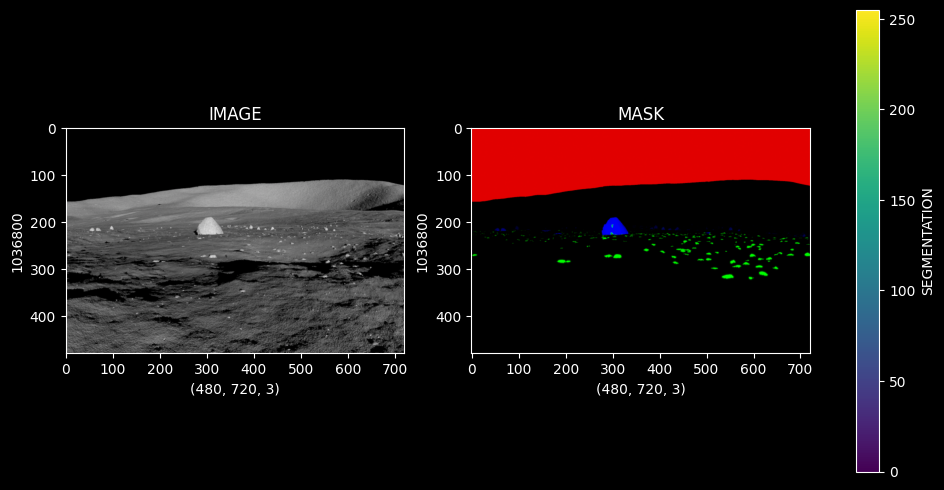

In [30]:
figure,axis = plt.subplots(1,2,figsize=(12,12))

Example_Picking_IMG = cv2.cvtColor(cv2.imread(Main_Data["IMAGE"][0]),cv2.COLOR_BGR2RGB)
Example_Picking_MASK = cv2.cvtColor(cv2.imread(Main_Data["MASK"][0]),cv2.COLOR_BGR2RGB)

axis[0].set_xlabel(Example_Picking_IMG.shape)
axis[0].set_ylabel(Example_Picking_IMG.size)
axis[0].set_title("IMAGE")
axis[0].imshow(Example_Picking_IMG)

axis[1].set_xlabel(Example_Picking_MASK.shape)
axis[1].set_ylabel(Example_Picking_MASK.size)
axis[1].set_title("MASK")
Operation_Colorbar = axis[1].imshow(Example_Picking_MASK)

figure.colorbar(Operation_Colorbar, ax=axis.ravel().tolist(), shrink=0.5,label='SEGMENTATION')

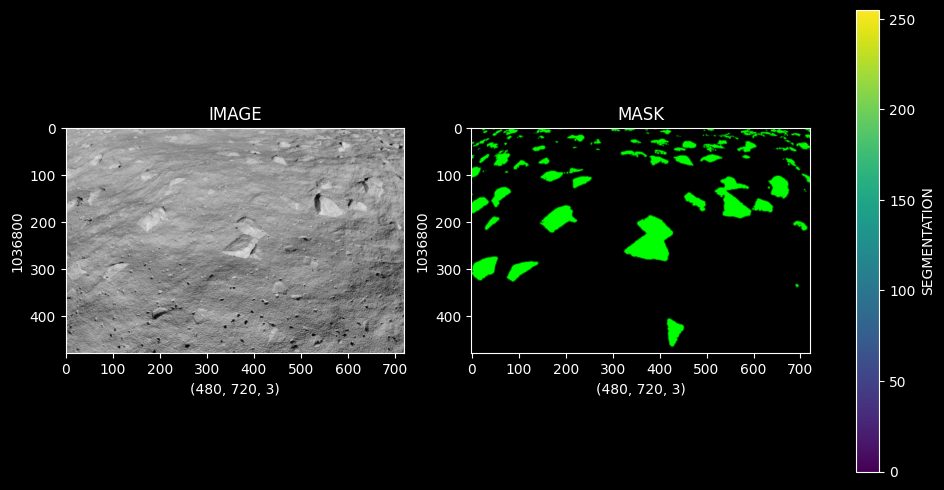

In [31]:
figure,axis = plt.subplots(1,2,figsize=(12,12))

Example_Picking_IMG = cv2.cvtColor(cv2.imread(Main_Data["IMAGE"][3777]),cv2.COLOR_BGR2RGB)
Example_Picking_MASK = cv2.cvtColor(cv2.imread(Main_Data["MASK"][3777]),cv2.COLOR_BGR2RGB)

axis[0].set_xlabel(Example_Picking_IMG.shape)
axis[0].set_ylabel(Example_Picking_IMG.size)
axis[0].set_title("IMAGE")
axis[0].imshow(Example_Picking_IMG)

axis[1].set_xlabel(Example_Picking_MASK.shape)
axis[1].set_ylabel(Example_Picking_MASK.size)
axis[1].set_title("MASK")
Operation_Colorbar = axis[1].imshow(Example_Picking_MASK)

figure.colorbar(Operation_Colorbar, ax=axis.ravel().tolist(), shrink=0.5,label='SEGMENTATION')

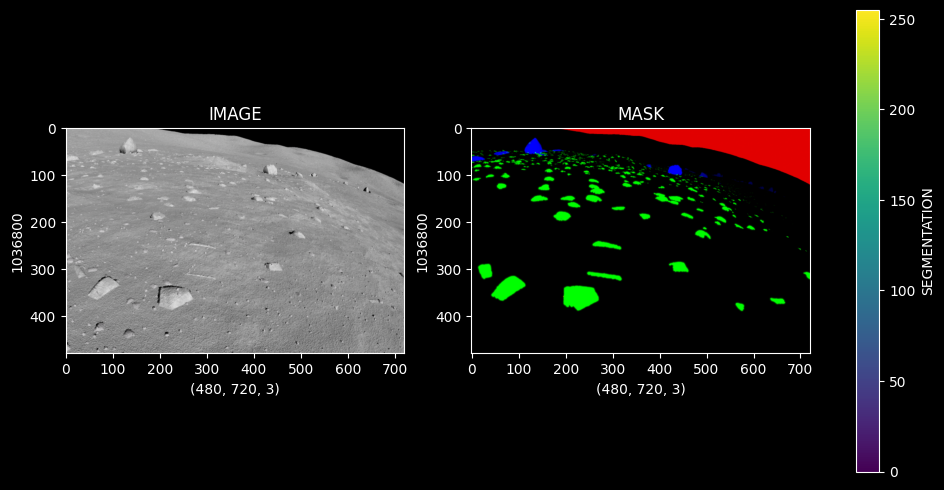

In [32]:
figure,axis = plt.subplots(1,2,figsize=(12,12))

Example_Picking_IMG = cv2.cvtColor(cv2.imread(Main_Data["IMAGE"][3000]),cv2.COLOR_BGR2RGB)
Example_Picking_MASK = cv2.cvtColor(cv2.imread(Main_Data["MASK"][3000]),cv2.COLOR_BGR2RGB)

axis[0].set_xlabel(Example_Picking_IMG.shape)
axis[0].set_ylabel(Example_Picking_IMG.size)
axis[0].set_title("IMAGE")
axis[0].imshow(Example_Picking_IMG)

axis[1].set_xlabel(Example_Picking_MASK.shape)
axis[1].set_ylabel(Example_Picking_MASK.size)
axis[1].set_title("MASK")
Operation_Colorbar = axis[1].imshow(Example_Picking_MASK)

figure.colorbar(Operation_Colorbar, ax=axis.ravel().tolist(), shrink=0.5,label='SEGMENTATION')

#### 2-D SPECTRUM

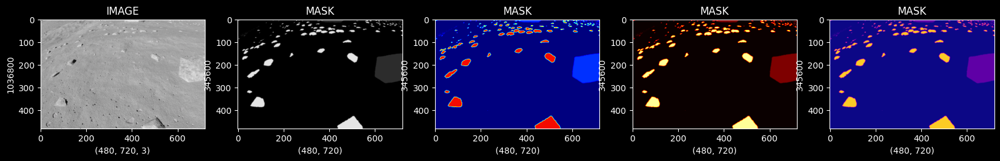

In [33]:
figure,axis = plt.subplots(1,5,figsize=(20,20))

Example_Picking_IMG = cv2.cvtColor(cv2.imread(Main_Data["IMAGE"][1]),cv2.COLOR_BGR2RGB)
Example_Picking_MASK = cv2.cvtColor(cv2.imread(Main_Data["MASK"][1]),cv2.COLOR_BGR2GRAY)

axis[0].set_xlabel(Example_Picking_IMG.shape)
axis[0].set_ylabel(Example_Picking_IMG.size)
axis[0].set_title("IMAGE")
axis[0].imshow(Example_Picking_IMG)

axis[1].set_xlabel(Example_Picking_MASK.shape)
axis[1].set_ylabel(Example_Picking_MASK.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Picking_MASK,cmap="gray")

axis[2].set_xlabel(Example_Picking_MASK.shape)
axis[2].set_ylabel(Example_Picking_MASK.size)
axis[2].set_title("MASK")
axis[2].imshow(Example_Picking_MASK,cmap="jet")

axis[3].set_xlabel(Example_Picking_MASK.shape)
axis[3].set_ylabel(Example_Picking_MASK.size)
axis[3].set_title("MASK")
axis[3].imshow(Example_Picking_MASK,cmap="hot")

axis[4].set_xlabel(Example_Picking_MASK.shape)
axis[4].set_ylabel(Example_Picking_MASK.size)
axis[4].set_title("MASK")
axis[4].imshow(Example_Picking_MASK,cmap="plasma")

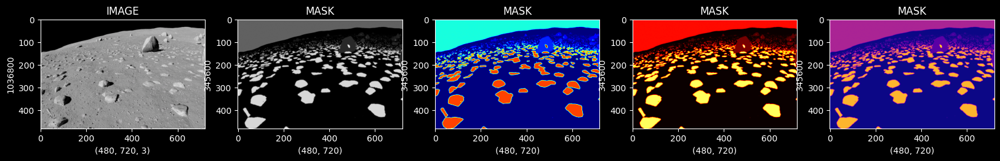

In [34]:
figure,axis = plt.subplots(1,5,figsize=(20,20))

Example_Picking_IMG = cv2.cvtColor(cv2.imread(Main_Data["IMAGE"][10]),cv2.COLOR_BGR2RGB)
Example_Picking_MASK = cv2.cvtColor(cv2.imread(Main_Data["MASK"][10]),cv2.COLOR_BGR2GRAY)

axis[0].set_xlabel(Example_Picking_IMG.shape)
axis[0].set_ylabel(Example_Picking_IMG.size)
axis[0].set_title("IMAGE")
axis[0].imshow(Example_Picking_IMG)

axis[1].set_xlabel(Example_Picking_MASK.shape)
axis[1].set_ylabel(Example_Picking_MASK.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Picking_MASK,cmap="gray")

axis[2].set_xlabel(Example_Picking_MASK.shape)
axis[2].set_ylabel(Example_Picking_MASK.size)
axis[2].set_title("MASK")
axis[2].imshow(Example_Picking_MASK,cmap="jet")

axis[3].set_xlabel(Example_Picking_MASK.shape)
axis[3].set_ylabel(Example_Picking_MASK.size)
axis[3].set_title("MASK")
axis[3].imshow(Example_Picking_MASK,cmap="hot")

axis[4].set_xlabel(Example_Picking_MASK.shape)
axis[4].set_ylabel(Example_Picking_MASK.size)
axis[4].set_title("MASK")
axis[4].imshow(Example_Picking_MASK,cmap="plasma")

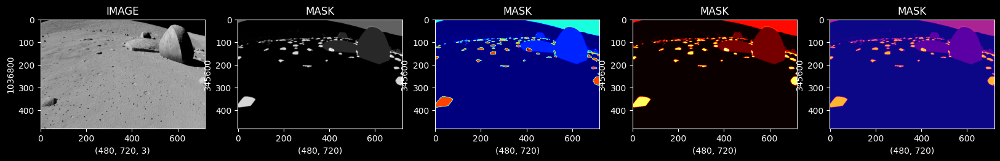

In [35]:
figure,axis = plt.subplots(1,5,figsize=(20,20))

Example_Picking_IMG = cv2.cvtColor(cv2.imread(Main_Data["IMAGE"][2345]),cv2.COLOR_BGR2RGB)
Example_Picking_MASK = cv2.cvtColor(cv2.imread(Main_Data["MASK"][2345]),cv2.COLOR_BGR2GRAY)

axis[0].set_xlabel(Example_Picking_IMG.shape)
axis[0].set_ylabel(Example_Picking_IMG.size)
axis[0].set_title("IMAGE")
axis[0].imshow(Example_Picking_IMG)

axis[1].set_xlabel(Example_Picking_MASK.shape)
axis[1].set_ylabel(Example_Picking_MASK.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Picking_MASK,cmap="gray")

axis[2].set_xlabel(Example_Picking_MASK.shape)
axis[2].set_ylabel(Example_Picking_MASK.size)
axis[2].set_title("MASK")
axis[2].imshow(Example_Picking_MASK,cmap="jet")

axis[3].set_xlabel(Example_Picking_MASK.shape)
axis[3].set_ylabel(Example_Picking_MASK.size)
axis[3].set_title("MASK")
axis[3].imshow(Example_Picking_MASK,cmap="hot")

axis[4].set_xlabel(Example_Picking_MASK.shape)
axis[4].set_ylabel(Example_Picking_MASK.size)
axis[4].set_title("MASK")
axis[4].imshow(Example_Picking_MASK,cmap="plasma")

#### LAYER READING

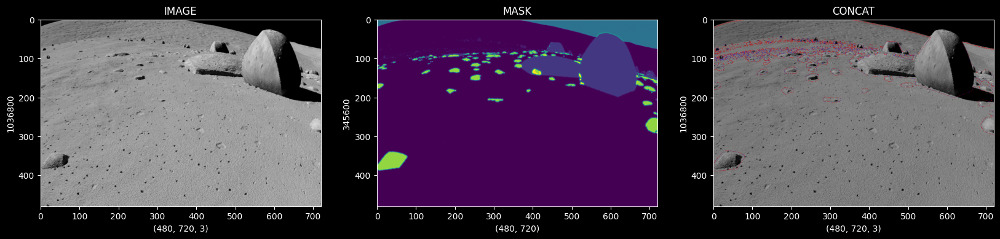

In [36]:
figure,axis = plt.subplots(1,3,figsize=(20,20))

Example_Picking_IMG = cv2.cvtColor(cv2.imread(Main_Data["IMAGE"][2345]),cv2.COLOR_BGR2RGB)
Example_Picking_MASK = cv2.cvtColor(cv2.imread(Main_Data["MASK"][2345]),cv2.COLOR_BGR2GRAY)

Copy_IMG = Example_Picking_IMG.copy()
Copy_IMG[Example_Picking_MASK == 1] = [255,0,0]
Copy_IMG[Example_Picking_MASK == 2] = [0,0,255]
Copy_Compile_IMG = Example_Picking_IMG.copy()

Layer_Concat_IMG = cv2.addWeighted(Copy_IMG,0.5,Copy_Compile_IMG,0.3,0,Copy_Compile_IMG)

axis[0].set_xlabel(Example_Picking_IMG.shape)
axis[0].set_ylabel(Example_Picking_IMG.size)
axis[0].set_title("IMAGE")
axis[0].imshow(Example_Picking_IMG)

axis[1].set_xlabel(Example_Picking_MASK.shape)
axis[1].set_ylabel(Example_Picking_MASK.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Picking_MASK)

axis[2].set_xlabel(Layer_Concat_IMG.shape)
axis[2].set_ylabel(Layer_Concat_IMG.size)
axis[2].set_title("CONCAT")
axis[2].imshow(Layer_Concat_IMG)

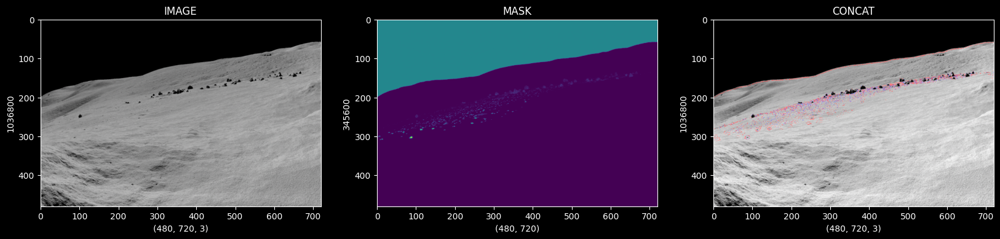

In [37]:
figure,axis = plt.subplots(1,3,figsize=(20,20))

Example_Picking_IMG = cv2.cvtColor(cv2.imread(Main_Data["IMAGE"][3]),cv2.COLOR_BGR2RGB)
Example_Picking_MASK = cv2.cvtColor(cv2.imread(Main_Data["MASK"][3]),cv2.COLOR_BGR2GRAY)

Copy_IMG = Example_Picking_IMG.copy()
Copy_IMG[Example_Picking_MASK == 1] = [255,0,0]
Copy_IMG[Example_Picking_MASK == 2] = [0,0,255]
Copy_Compile_IMG = Example_Picking_IMG.copy()

Layer_Concat_IMG = cv2.addWeighted(Copy_IMG,0.5,Copy_Compile_IMG,0.8,0.2,Copy_Compile_IMG)

axis[0].set_xlabel(Example_Picking_IMG.shape)
axis[0].set_ylabel(Example_Picking_IMG.size)
axis[0].set_title("IMAGE")
axis[0].imshow(Example_Picking_IMG)

axis[1].set_xlabel(Example_Picking_MASK.shape)
axis[1].set_ylabel(Example_Picking_MASK.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Picking_MASK)

axis[2].set_xlabel(Layer_Concat_IMG.shape)
axis[2].set_ylabel(Layer_Concat_IMG.size)
axis[2].set_title("CONCAT")
axis[2].imshow(Layer_Concat_IMG)

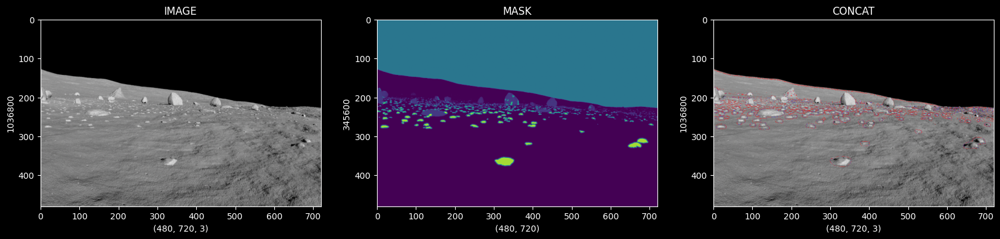

In [38]:
figure,axis = plt.subplots(1,3,figsize=(20,20))

Example_Picking_IMG = cv2.cvtColor(cv2.imread(Main_Data["IMAGE"][12]),cv2.COLOR_BGR2RGB)
Example_Picking_MASK = cv2.cvtColor(cv2.imread(Main_Data["MASK"][12]),cv2.COLOR_BGR2GRAY)

Copy_IMG = Example_Picking_IMG.copy()
Copy_IMG[Example_Picking_MASK == 1] = [255,0,0]
Copy_IMG[Example_Picking_MASK == 2] = [0,0,255]

Copy_Compile_IMG = Example_Picking_IMG.copy()

Layer_Concat_IMG = cv2.addWeighted(Copy_IMG,0.5,Copy_Compile_IMG,0.5,0,Copy_Compile_IMG)

axis[0].set_xlabel(Example_Picking_IMG.shape)
axis[0].set_ylabel(Example_Picking_IMG.size)
axis[0].set_title("IMAGE")
axis[0].imshow(Example_Picking_IMG)

axis[1].set_xlabel(Example_Picking_MASK.shape)
axis[1].set_ylabel(Example_Picking_MASK.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Picking_MASK)

axis[2].set_xlabel(Layer_Concat_IMG.shape)
axis[2].set_ylabel(Layer_Concat_IMG.size)
axis[2].set_title("CONCAT")
axis[2].imshow(Layer_Concat_IMG)

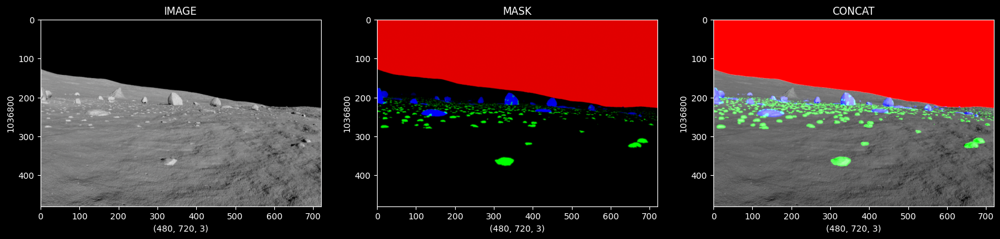

In [39]:
figure,axis = plt.subplots(1,3,figsize=(20,20))

Example_Picking_IMG = cv2.cvtColor(cv2.imread(Main_Data["IMAGE"][12]),cv2.COLOR_BGR2RGB)
Example_Picking_MASK = cv2.cvtColor(cv2.imread(Main_Data["MASK"][12]),cv2.COLOR_BGR2RGB)


Layer_Concat_IMG = cv2.addWeighted(Example_Picking_IMG,0.8,Example_Picking_MASK,5.0,0.5)

axis[0].set_xlabel(Example_Picking_IMG.shape)
axis[0].set_ylabel(Example_Picking_IMG.size)
axis[0].set_title("IMAGE")
axis[0].imshow(Example_Picking_IMG)

axis[1].set_xlabel(Example_Picking_MASK.shape)
axis[1].set_ylabel(Example_Picking_MASK.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Picking_MASK)

axis[2].set_xlabel(Layer_Concat_IMG.shape)
axis[2].set_ylabel(Layer_Concat_IMG.size)
axis[2].set_title("CONCAT")
axis[2].imshow(Layer_Concat_IMG)

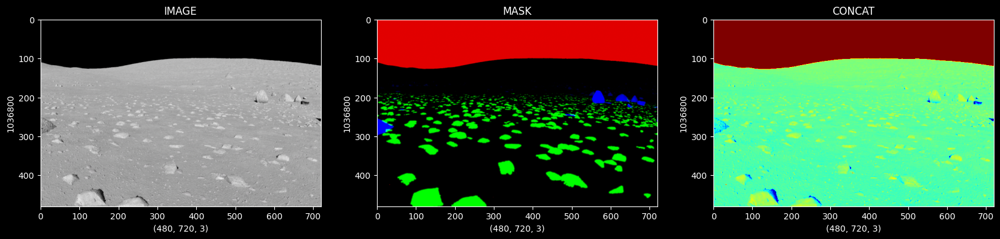

In [40]:
figure,axis = plt.subplots(1,3,figsize=(20,20))

Example_Picking_IMG = cv2.cvtColor(cv2.imread(Main_Data["IMAGE"][888]),cv2.COLOR_BGR2RGB)
Example_Picking_MASK = cv2.cvtColor(cv2.imread(Main_Data["MASK"][888]),cv2.COLOR_BGR2RGB)

Layer_Concat_IMG = cv2.addWeighted(Example_Picking_IMG,0.7,Example_Picking_MASK,2.9,1.5)

axis[0].set_xlabel(Example_Picking_IMG.shape)
axis[0].set_ylabel(Example_Picking_IMG.size)
axis[0].set_title("IMAGE")
axis[0].imshow(Example_Picking_IMG)

axis[1].set_xlabel(Example_Picking_MASK.shape)
axis[1].set_ylabel(Example_Picking_MASK.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Picking_MASK)


axis[2].set_xlabel(Layer_Concat_IMG.shape)
axis[2].set_ylabel(Layer_Concat_IMG.size)
axis[2].set_title("CONCAT")
axis[2].imshow(Layer_Concat_IMG[:,:,0],cmap="jet")

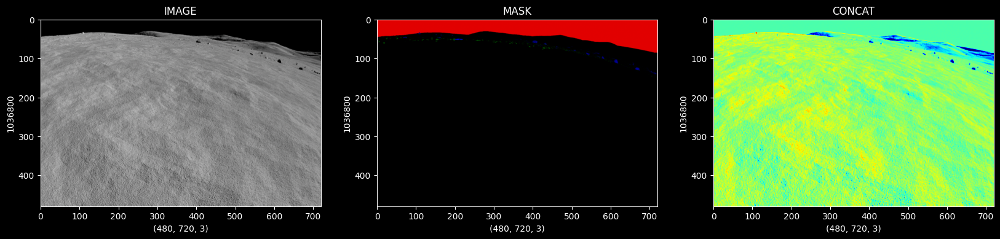

In [41]:
figure,axis = plt.subplots(1,3,figsize=(20,20))

Example_Picking_IMG = cv2.cvtColor(cv2.imread(Main_Data["IMAGE"][552]),cv2.COLOR_BGR2RGB)
Example_Picking_MASK = cv2.cvtColor(cv2.imread(Main_Data["MASK"][552]),cv2.COLOR_BGR2RGB)


Layer_Concat_IMG = cv2.addWeighted(Example_Picking_IMG,0.8,Example_Picking_MASK,0.4,0.5)

axis[0].set_xlabel(Example_Picking_IMG.shape)
axis[0].set_ylabel(Example_Picking_IMG.size)
axis[0].set_title("IMAGE")
axis[0].imshow(Example_Picking_IMG)

axis[1].set_xlabel(Example_Picking_MASK.shape)
axis[1].set_ylabel(Example_Picking_MASK.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Picking_MASK)

axis[2].set_xlabel(Layer_Concat_IMG.shape)
axis[2].set_ylabel(Layer_Concat_IMG.size)
axis[2].set_title("CONCAT")
axis[2].imshow(Layer_Concat_IMG[:,:,0],cmap="jet")

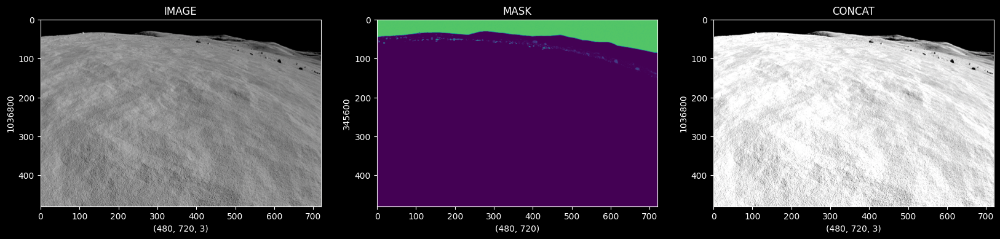

In [42]:
figure,axis = plt.subplots(1,3,figsize=(20,20))

Example_Picking_IMG = cv2.cvtColor(cv2.imread(Main_Data["IMAGE"][552]),cv2.COLOR_BGR2RGB)
Example_Picking_MASK = cv2.cvtColor(cv2.imread(Main_Data["MASK"][552]),cv2.COLOR_BGR2GRAY)

Copy_IMG = Example_Picking_IMG.copy()
Copy_IMG[Example_Picking_MASK == 255] = (255,0,255)

Layer_Concat_IMG = cv2.addWeighted(Example_Picking_IMG,0.8,Copy_IMG,0.9,0.5)

axis[0].set_xlabel(Example_Picking_IMG.shape)
axis[0].set_ylabel(Example_Picking_IMG.size)
axis[0].set_title("IMAGE")
axis[0].imshow(Example_Picking_IMG)

axis[1].set_xlabel(Example_Picking_MASK.shape)
axis[1].set_ylabel(Example_Picking_MASK.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Picking_MASK)

axis[2].set_xlabel(Layer_Concat_IMG.shape)
axis[2].set_ylabel(Layer_Concat_IMG.size)
axis[2].set_title("CONCAT")
axis[2].imshow(Layer_Concat_IMG)

#### BOUNDING

In [43]:
print(Bounding_Box.iloc[0].values)

[278.5 192.5  56.   38. ]


In [44]:
print(Bounding_Box.iloc[0].values[0])
print(Bounding_Box.iloc[0].values[1])
print(Bounding_Box.iloc[0].values[2])
print(Bounding_Box.iloc[0].values[3])

278.5
192.5
56.0
38.0


In [45]:
print(Bounding_Box.iloc[0].values.reshape(2,2))

[[278.5 192.5]
 [ 56.   38. ]]


In [46]:
for coordinates_x, coordinates_y in Bounding_Box.iloc[0].values.reshape(2,2):
    coordinates_x = int(coordinates_x)
    coordinates_y = int(coordinates_y)
    print(coordinates_x)
    print(coordinates_y)

278
192
56
38


In [47]:
for coordinates_x, coordinates_y in Bounding_Box.iloc[0].values.reshape(2,2):
    print(coordinates_x)
    print(coordinates_y)

278.5
192.5
56.0
38.0


In [48]:
x = Bounding_Box.iloc[2].values[0]
y = Bounding_Box.iloc[2].values[1]
t = Bounding_Box.iloc[2].values[2]
s = Bounding_Box.iloc[2].values[3]
start_point = (x, y)
end_point = (x + t, y + s)
print(start_point)
print(end_point)

(5.5, 46.5)
(95.5, 133.5)


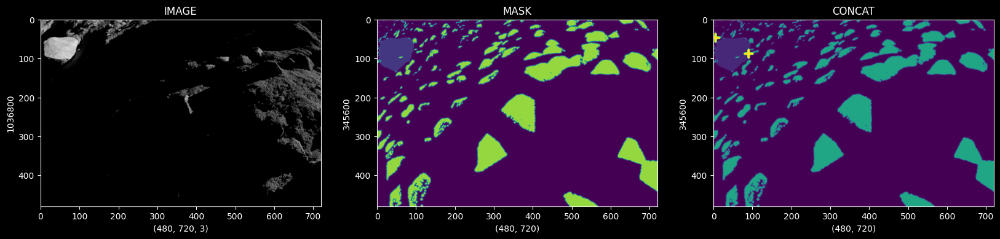

In [49]:
figure,axis = plt.subplots(1,3,figsize=(20,20))

Example_Picking_IMG = cv2.cvtColor(cv2.imread(Main_Data["IMAGE"][2]),cv2.COLOR_BGR2RGB)
Example_Picking_MASK = cv2.cvtColor(cv2.imread(Main_Data["MASK"][2]),cv2.COLOR_BGR2GRAY)

Copy_Mask = Example_Picking_MASK.copy()
for coordinates_x, coordinates_y in Bounding_Box.iloc[2].values.reshape(2,2):
    coordinates_x = int(coordinates_x)
    coordinates_y = int(coordinates_y)
    cv2.drawMarker(Copy_Mask, (coordinates_x, coordinates_y), (255, 0, 0),thickness=5)

axis[0].set_xlabel(Example_Picking_IMG.shape)
axis[0].set_ylabel(Example_Picking_IMG.size)
axis[0].set_title("IMAGE")
axis[0].imshow(Example_Picking_IMG)

axis[1].set_xlabel(Example_Picking_MASK.shape)
axis[1].set_ylabel(Example_Picking_MASK.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Picking_MASK)

axis[2].set_xlabel(Copy_Mask.shape)
axis[2].set_ylabel(Copy_Mask.size)
axis[2].set_title("CONCAT")
axis[2].imshow(Copy_Mask)

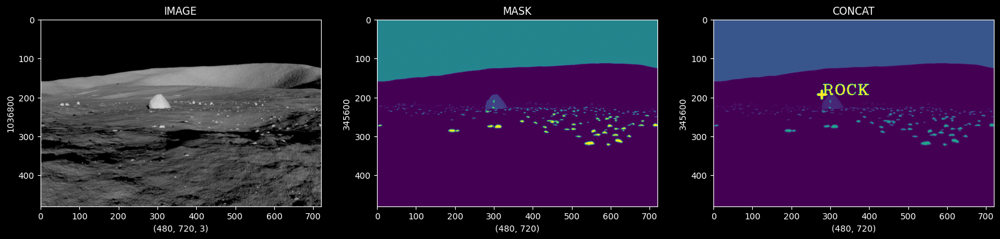

In [50]:
figure,axis = plt.subplots(1,3,figsize=(20,20))

Example_Picking_IMG = cv2.cvtColor(cv2.imread(Main_Data["IMAGE"][0]),cv2.COLOR_BGR2RGB)
Example_Picking_MASK = cv2.cvtColor(cv2.imread(Main_Data["MASK"][0]),cv2.COLOR_BGR2GRAY)

Copy_Mask = Example_Picking_MASK.copy()

x = Bounding_Box.iloc[0].values[0]
y = Bounding_Box.iloc[0].values[1]
t = Bounding_Box.iloc[0].values[2]
s = Bounding_Box.iloc[0].values[3]


Copy_Mask = Example_Picking_MASK.copy()

Marker_Image = cv2.drawMarker(Copy_Mask, (int(x), int(y)), (255, 0, 0),thickness=5)
cv2.putText(Copy_Mask, "ROCK", (int(x), int(y)), cv2.FONT_HERSHEY_COMPLEX_SMALL, 2, (255, 0, 0), 2)

axis[0].set_xlabel(Example_Picking_IMG.shape)
axis[0].set_ylabel(Example_Picking_IMG.size)
axis[0].set_title("IMAGE")
axis[0].imshow(Example_Picking_IMG)

axis[1].set_xlabel(Example_Picking_MASK.shape)
axis[1].set_ylabel(Example_Picking_MASK.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Picking_MASK)

axis[2].set_xlabel(Marker_Image.shape)
axis[2].set_ylabel(Marker_Image.size)
axis[2].set_title("CONCAT")
axis[2].imshow(Marker_Image)

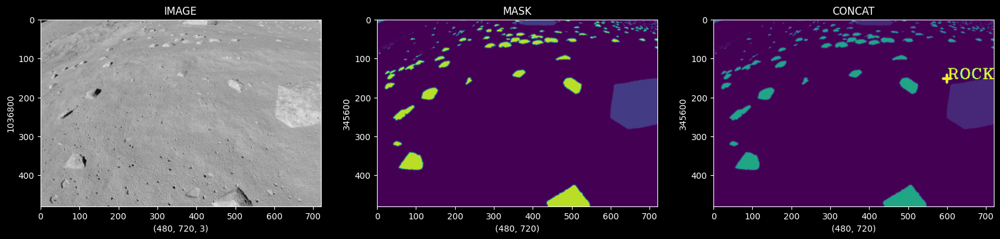

In [51]:
figure,axis = plt.subplots(1,3,figsize=(20,20))

Example_Picking_IMG = cv2.cvtColor(cv2.imread(Main_Data["IMAGE"][1]),cv2.COLOR_BGR2RGB)
Example_Picking_MASK = cv2.cvtColor(cv2.imread(Main_Data["MASK"][1]),cv2.COLOR_BGR2GRAY)

Copy_Mask = Example_Picking_MASK.copy()

x = Bounding_Box.iloc[1].values[0]
y = Bounding_Box.iloc[1].values[1]
t = Bounding_Box.iloc[1].values[2]
s = Bounding_Box.iloc[1].values[3]


Copy_Mask = Example_Picking_MASK.copy()

Marker_Image = cv2.drawMarker(Copy_Mask, (int(x), int(y)), (255, 0, 0),thickness=5)
cv2.putText(Copy_Mask, "ROCK", (int(x), int(y)), cv2.FONT_HERSHEY_COMPLEX_SMALL, 2, (255, 0, 0), 2)
axis[0].set_xlabel(Example_Picking_IMG.shape)
axis[0].set_ylabel(Example_Picking_IMG.size)
axis[0].set_title("IMAGE")
axis[0].imshow(Example_Picking_IMG)

axis[1].set_xlabel(Example_Picking_MASK.shape)
axis[1].set_ylabel(Example_Picking_MASK.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Picking_MASK)

axis[2].set_xlabel(Marker_Image.shape)
axis[2].set_ylabel(Marker_Image.size)
axis[2].set_title("CONCAT")
axis[2].imshow(Marker_Image)

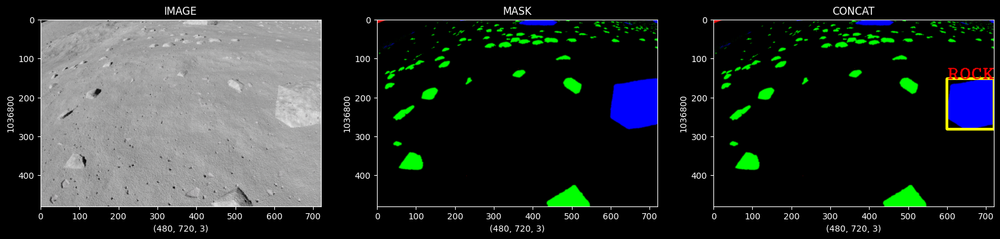

In [52]:
figure,axis = plt.subplots(1,3,figsize=(20,20))

Example_Picking_IMG = cv2.cvtColor(cv2.imread(Main_Data["IMAGE"][1]),cv2.COLOR_BGR2RGB)
Example_Picking_MASK = cv2.cvtColor(cv2.imread(Main_Data["MASK"][1]),cv2.COLOR_BGR2RGB)

Copy_Mask = Example_Picking_MASK.copy()

x = Bounding_Box.iloc[1].values[0]
y = Bounding_Box.iloc[1].values[1]
t = Bounding_Box.iloc[1].values[2]
s = Bounding_Box.iloc[1].values[3]

Copy_Mask = Example_Picking_MASK.copy()

Rec_IMG = cv2.rectangle(Copy_Mask, (int(x), int(y)), (int(x + t), int(y + s)), (255, 255, 0), 5)
cv2.putText(Copy_Mask, "ROCK", (int(x), int(y)), cv2.FONT_HERSHEY_COMPLEX_SMALL, 2, (255, 0, 0), 2)

axis[0].set_xlabel(Example_Picking_IMG.shape)
axis[0].set_ylabel(Example_Picking_IMG.size)
axis[0].set_title("IMAGE")
axis[0].imshow(Example_Picking_IMG)

axis[1].set_xlabel(Example_Picking_MASK.shape)
axis[1].set_ylabel(Example_Picking_MASK.size)
axis[1].set_title("MASK")
axis[1].imshow(Example_Picking_MASK)

axis[2].set_xlabel(Rec_IMG.shape)
axis[2].set_ylabel(Rec_IMG.size)
axis[2].set_title("CONCAT")
axis[2].imshow(Rec_IMG)

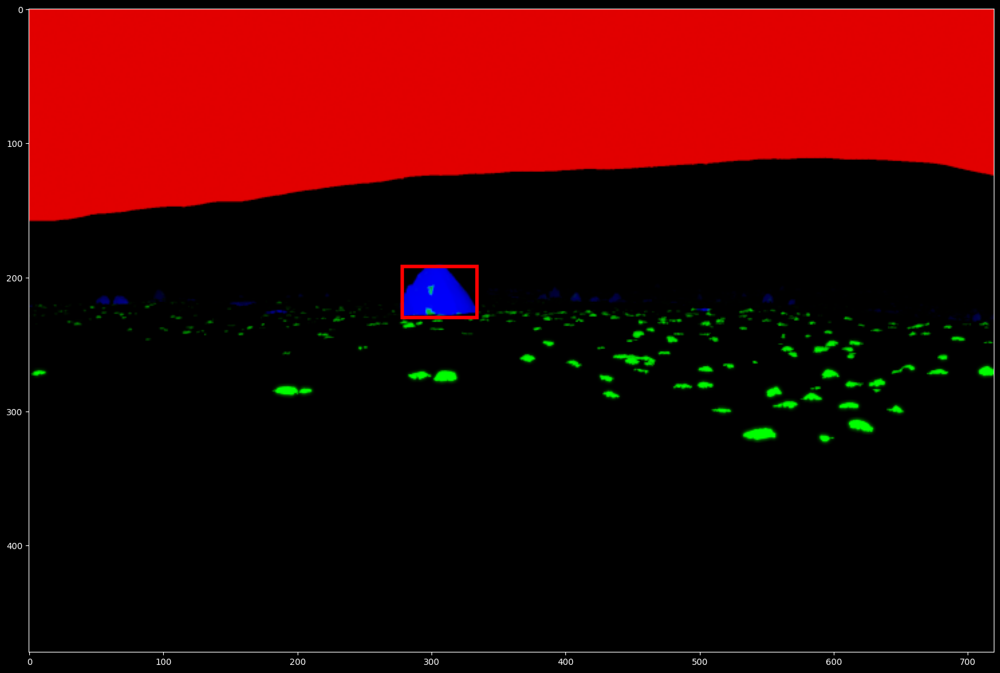

In [53]:
figure,axis = plt.subplots(1,figsize=(20,20))

Example_Picking_IMG = cv2.cvtColor(cv2.imread(Main_Data["IMAGE"][0]),cv2.COLOR_BGR2RGB)
Example_Picking_MASK = cv2.cvtColor(cv2.imread(Main_Data["MASK"][0]),cv2.COLOR_BGR2RGB)

Bound_Coor = []
with open("./Moon_Dataset/bounding_boxes.csv") as bounding_boxes_csv:
    CSV_Reader = csv.reader(bounding_boxes_csv, delimiter=',')
    next(bounding_boxes_csv)
    for rows in CSV_Reader:
        if rows[0] == '1':
            Bound_Coor.append(rows[1:5])
        else:
            break
axis.imshow(Example_Picking_MASK)

for bounding_coor in Bound_Coor:
    bounding_box = list(map(float, bounding_coor)) 
    Rect_Image = patches.Rectangle((bounding_box[0]-0.5,bounding_box[1]-0.5),
                             bounding_box[2],bounding_box[3],
                             linewidth=4,
                             edgecolor='r',facecolor='none')
    axis.add_patch(Rect_Image)

# TRANSFORMATION DATA

#### REDUCING FOR MEMORY FOR KERNEL

In [54]:
Main_Data_Reduced = Main_Data[0:1000]

In [55]:
print(Main_Data_Reduced.head(-1))

                                         IMAGE  \
0    Moon_Dataset\images\render\render0001.png   
1    Moon_Dataset\images\render\render0002.png   
2    Moon_Dataset\images\render\render0003.png   
3    Moon_Dataset\images\render\render0004.png   
4    Moon_Dataset\images\render\render0005.png   
..                                         ...   
994  Moon_Dataset\images\render\render0995.png   
995  Moon_Dataset\images\render\render0996.png   
996  Moon_Dataset\images\render\render0997.png   
997  Moon_Dataset\images\render\render0998.png   
998  Moon_Dataset\images\render\render0999.png   

                                          MASK  
0    Moon_Dataset\images\ground\ground0001.png  
1    Moon_Dataset\images\ground\ground0002.png  
2    Moon_Dataset\images\ground\ground0003.png  
3    Moon_Dataset\images\ground\ground0004.png  
4    Moon_Dataset\images\ground\ground0005.png  
..                                         ...  
994  Moon_Dataset\images\ground\ground0995.png  
995  Mo

#### IMAGE TRANSFORMATION FOR LABELING

In [56]:
Image_List = []
Transformation_List = []

for image_x,mask_x in zip(Main_Data_Reduced.IMAGE.values,Main_Data_Reduced.MASK.values):
    
    Picking_IMG = cv2.cvtColor(cv2.imread(image_x),cv2.COLOR_BGR2RGB)
    Picking_MASK = cv2.cvtColor(cv2.imread(mask_x),cv2.COLOR_BGR2RGB)
    Layer_Concat_IMG = cv2.addWeighted(Picking_IMG,0.8,Picking_MASK,5.0,0.5)
    
    Resized_Image = cv2.resize(Picking_IMG,(256,256))
    Resized_Transformation = cv2.resize(Layer_Concat_IMG,(256,256))
    
    Resized_Image = Resized_Image / 255.
    Resized_Transformation = Resized_Transformation / 255.
    
    Image_List.append(Resized_Image)
    Transformation_List.append(Resized_Transformation)

In [57]:
print("ARRAY IMAGE SHAPE: ",np.shape(np.array(Image_List)))
print("ARRAY MASK SHAPE: ",np.shape(np.array(Transformation_List)))

ARRAY IMAGE SHAPE:  (1000, 256, 256, 3)
ARRAY MASK SHAPE:  (1000, 256, 256, 3)


Text(0.5, 1.0, 'LUNAR')

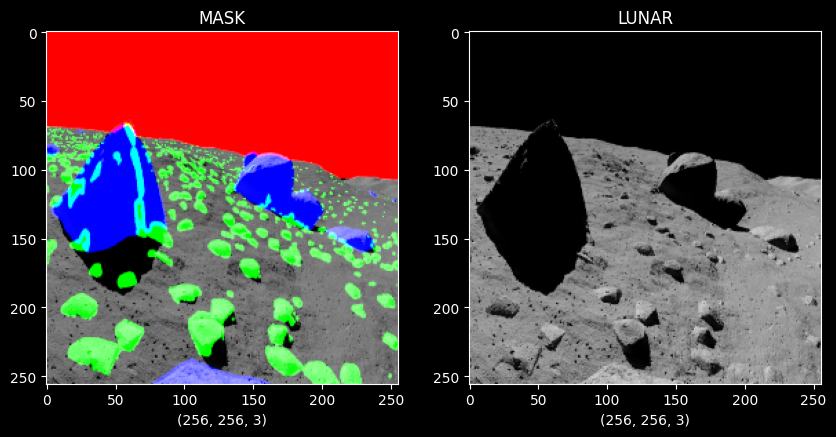

In [58]:
figure,axis = plt.subplots(1,2,figsize=(10,10))

axis[0].imshow(Transformation_List[14])
axis[0].set_xlabel(Transformation_List[14].shape)
axis[0].set_title("MASK")
axis[1].imshow(Image_List[14])
axis[1].set_xlabel(Image_List[14].shape)
axis[1].set_title("LUNAR")

Text(0.5, 1.0, 'LUNAR')

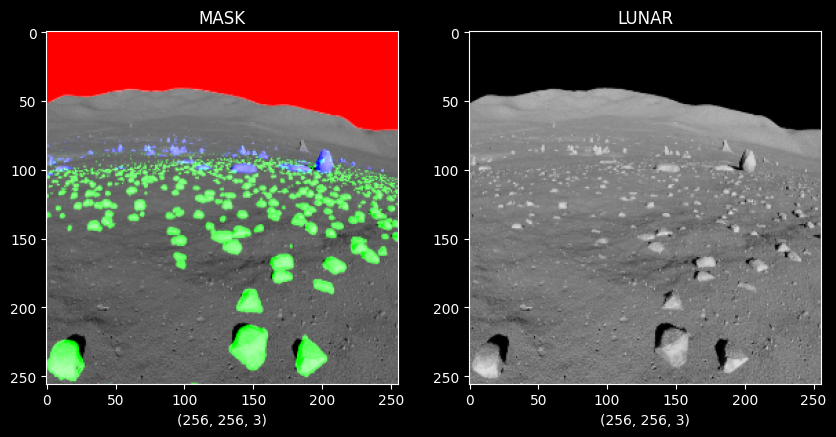

In [59]:
figure,axis = plt.subplots(1,2,figsize=(10,10))

axis[0].imshow(Transformation_List[100])
axis[0].set_xlabel(Transformation_List[100].shape)
axis[0].set_title("MASK")
axis[1].imshow(Image_List[100])
axis[1].set_xlabel(Image_List[100].shape)
axis[1].set_title("LUNAR")

Text(0.5, 1.0, 'LUNAR')

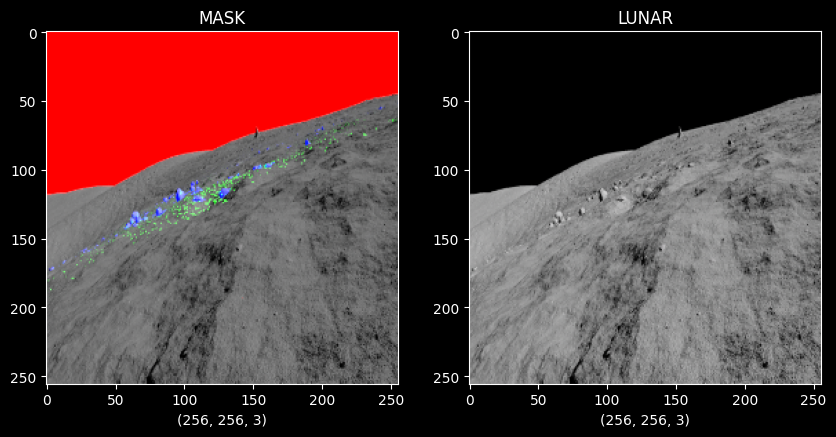

In [60]:
figure,axis = plt.subplots(1,2,figsize=(10,10))

axis[0].imshow(Transformation_List[450])
axis[0].set_xlabel(Transformation_List[450].shape)
axis[0].set_title("MASK")
axis[1].imshow(Image_List[450])
axis[1].set_xlabel(Image_List[450].shape)
axis[1].set_title("LUNAR")

#### TRANSFORMATION ARRAY

In [61]:
Train_Set = np.array(Image_List,dtype="float32")
Transformation_Set = np.array(Transformation_List,dtype="float32")

In [62]:
print("TRAIN SHAPE: ",Train_Set.shape)
print("TRANSFORMATION SHAPE: ",Transformation_Set.shape)
print("---"*10)
print("TRAIN DTYPE: ",Train_Set.dtype)
print("TRANSFORMATION DTYPE: ",Transformation_Set.dtype)

TRAIN SHAPE:  (1000, 256, 256, 3)
TRANSFORMATION SHAPE:  (1000, 256, 256, 3)
------------------------------
TRAIN DTYPE:  float32
TRANSFORMATION DTYPE:  float32


# AUTO ENCODER PROCESS AND PARAMETERS

![](https://www.researchgate.net/publication/309139997/figure/fig1/AS:613952190963731@1523389017281/Architecture-of-an-auto-encoder-and-decoder-in-a-deep-neural-network-DNN.png)

In [63]:
compile_loss = "binary_crossentropy"
compile_optimizer = Adam(learning_rate=0.0001)
output_class = 1

In [64]:
Checkpoint_Model = tf.keras.callbacks.ModelCheckpoint(monitor="accuracy",
                                                      save_best_only=True,
                                                      save_weights_only=True,
                                                      filepath="./modelcheck")

In [65]:
#Encoder 
E_AE = Sequential()

E_AE.add(Conv2D(32,(2,2),kernel_initializer = 'he_normal',use_bias = True, padding="same"))
E_AE.add(BatchNormalization())
E_AE.add(ReLU())

E_AE.add(Conv2D(64,(2,2),kernel_initializer = 'he_normal',use_bias = True, padding="same"))
E_AE.add(BatchNormalization())
E_AE.add(ReLU())

E_AE.add(Conv2D(128,(5,5),kernel_initializer = 'he_normal',use_bias = True, padding="same"))
E_AE.add(BatchNormalization())
E_AE.add(ReLU())

#Decoder
D_AE = Sequential()

D_AE.add(Conv2DTranspose(64,(2,2), padding="same"))
D_AE.add(ReLU())

D_AE.add(Conv2DTranspose(32,(5,5), padding="same"))
D_AE.add(ReLU())

D_AE.add(Conv2DTranspose(output_class,(5,5), padding="same"))
D_AE.add(ReLU())

In [68]:
print(D_AE.summary())

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_transpose (Conv2DTr  (None, 256, 256, 64)      32832     
 anspose)                                                        
                                                                 
 re_lu_3 (ReLU)              (None, 256, 256, 64)      0         
                                                                 
 conv2d_transpose_1 (Conv2D  (None, 256, 256, 32)      51232     
 Transpose)                                                      
                                                                 
 re_lu_4 (ReLU)              (None, 256, 256, 32)      0         
                                                                 
 conv2d_transpose_2 (Conv2D  (None, 256, 256, 1)       801       
 Transpose)                                                      
                                                      

In [69]:
print(E_AE.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 256, 256, 32)      416       
                                                                 
 batch_normalization (Batch  (None, 256, 256, 32)      128       
 Normalization)                                                  
                                                                 
 re_lu (ReLU)                (None, 256, 256, 32)      0         
                                                                 
 conv2d_1 (Conv2D)           (None, 256, 256, 64)      8256      
                                                                 
 batch_normalization_1 (Bat  (None, 256, 256, 64)      256       
 chNormalization)                                                
                                                                 
 re_lu_1 (ReLU)              (None, 256, 256, 64)      0

In [70]:
Auto_Encoder = Sequential([E_AE,D_AE])
Auto_Encoder.compile(loss=compile_loss,optimizer=compile_optimizer,metrics=["accuracy"])


In [71]:
Model_AutoEncoder = Auto_Encoder.fit(Train_Set,Transformation_Set,epochs=55,callbacks=[Checkpoint_Model])
Auto_Encoder.save("auto_encoder_model.h5")

Epoch 1/55
32/32 [==============================] - 827s 25s/step - loss: 1.2623 - accuracy: 0.1457
Epoch 2/55
32/32 [==============================] - 788s 25s/step - loss: 0.7735 - accuracy: 0.1761
Epoch 3/55
32/32 [==============================] - 788s 25s/step - loss: 0.7151 - accuracy: 0.1769
Epoch 4/55
32/32 [==============================] - 787s 25s/step - loss: 0.6972 - accuracy: 0.1767
Epoch 5/55
32/32 [==============================] - 790s 25s/step - loss: 0.6887 - accuracy: 0.1769
Epoch 6/55
32/32 [==============================] - 788s 25s/step - loss: 0.6830 - accuracy: 0.1773
Epoch 7/55
32/32 [==============================] - 787s 25s/step - loss: 0.6695 - accuracy: 0.1770
Epoch 8/55
32/32 [==============================] - 787s 25s/step - loss: 0.6625 - accuracy: 0.1773
Epoch 9/55
32/32 [==============================] - 787s 25s/step - loss: 0.6601 - accuracy: 0.1773
Epoch 10/55
32/32 [==============================] - 788s 25s/step - loss: 0.6577 - accuracy: 0.1772

In [ ]:
print(Auto_Encoder.summary())

In [75]:
print(Auto_Encoder.layers)

[<keras.src.engine.sequential.Sequential object at 0x000001C62D5EA950>, <keras.src.engine.sequential.Sequential object at 0x000001C6327D7090>]


In [76]:
print(Model_AutoEncoder.params)

{'verbose': 1, 'epochs': 10, 'steps': 32}


#### SAMPLE PREDICTION

In [2]:
from keras.models import load_model

# Load the saved model
loaded_model = load_model("auto_encoder_model.h5")


In [84]:
Prediction_MASK_Seen = Auto_Encoder.predict(Train_Set[:10])

1/1 [==============================] - 3s 3s/step


Text(0.5, 1.0, 'PREDICTION')

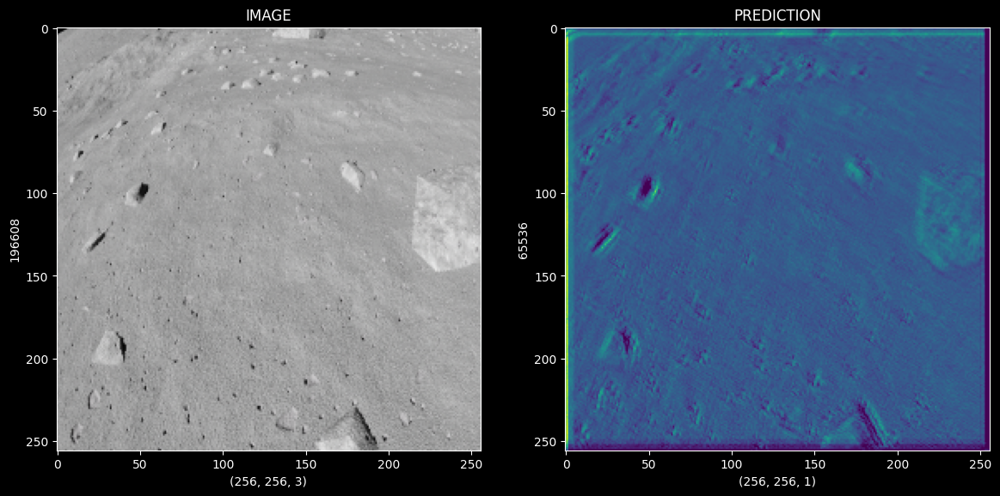

In [85]:
figure,axis = plt.subplots(1,2,figsize=(14,14))
pre_img_number = 1

Original_Img = Train_Set[pre_img_number]
Predict_Mask = Prediction_MASK_Seen[pre_img_number]

axis[0].imshow(Original_Img)
axis[0].set_xlabel(Original_Img.shape)
axis[0].set_ylabel(Original_Img.size)
axis[0].set_title("IMAGE")
axis[1].imshow(Predict_Mask)
axis[1].set_xlabel(Predict_Mask.shape)
axis[1].set_ylabel(Predict_Mask.size)
axis[1].set_title("PREDICTION")

Text(0.5, 1.0, 'PREDICTION')

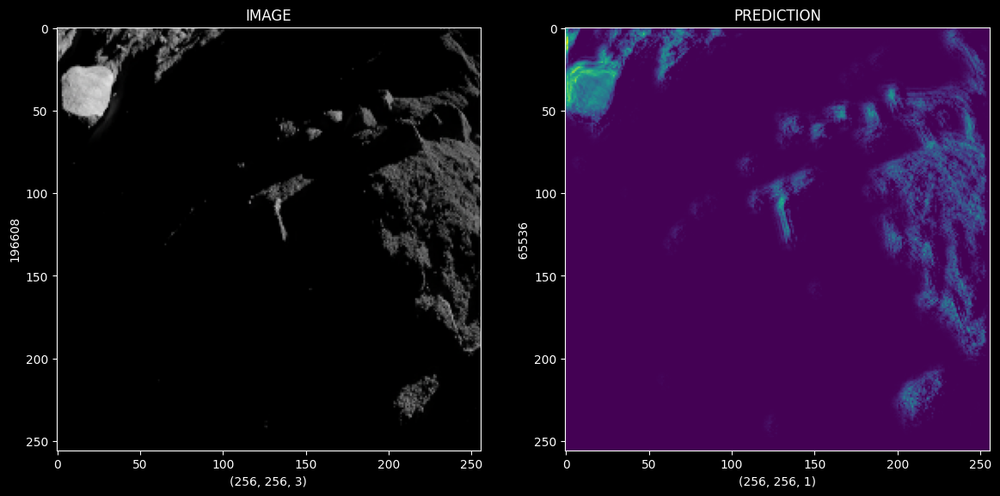

In [86]:
figure,axis = plt.subplots(1,2,figsize=(14,14))
pre_img_number = 2

Original_Img = Train_Set[pre_img_number]
Predict_Mask = Prediction_MASK_Seen[pre_img_number]

axis[0].imshow(Original_Img)
axis[0].set_xlabel(Original_Img.shape)
axis[0].set_ylabel(Original_Img.size)
axis[0].set_title("IMAGE")
axis[1].imshow(Predict_Mask)
axis[1].set_xlabel(Predict_Mask.shape)
axis[1].set_ylabel(Predict_Mask.size)
axis[1].set_title("PREDICTION")

Text(0.5, 1.0, 'PREDICTION')

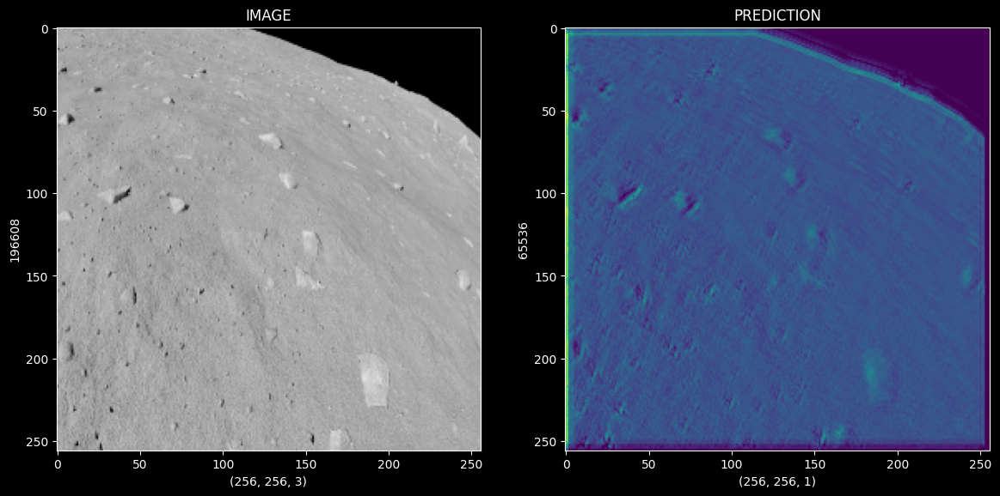

In [87]:
figure,axis = plt.subplots(1,2,figsize=(14,14))
pre_img_number = 5

Original_Img = Train_Set[pre_img_number]
Predict_Mask = Prediction_MASK_Seen[pre_img_number]

axis[0].imshow(Original_Img)
axis[0].set_xlabel(Original_Img.shape)
axis[0].set_ylabel(Original_Img.size)
axis[0].set_title("IMAGE")
axis[1].imshow(Predict_Mask)
axis[1].set_xlabel(Predict_Mask.shape)
axis[1].set_ylabel(Predict_Mask.size)
axis[1].set_title("PREDICTION")

Text(0.5, 1.0, 'PREDICTION')

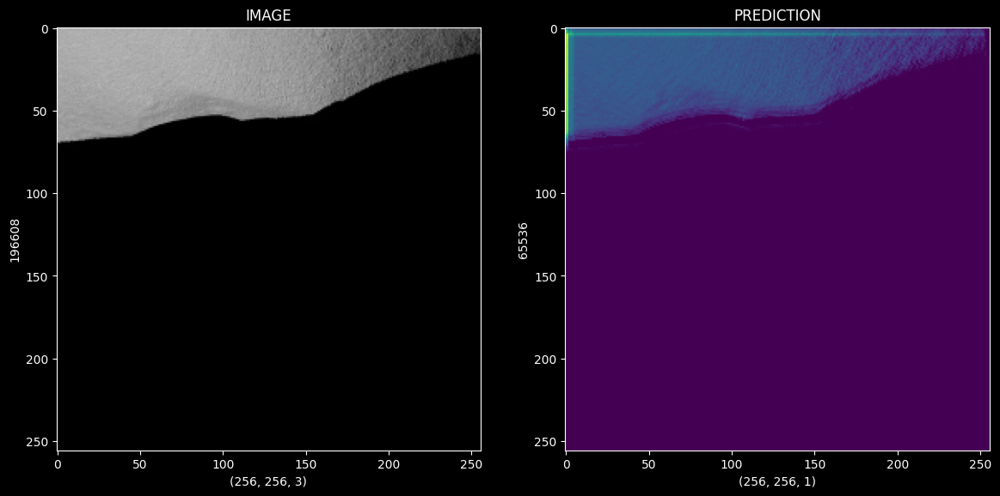

In [88]:
figure,axis = plt.subplots(1,2,figsize=(14,14))
pre_img_number = 8

Original_Img = Train_Set[pre_img_number]
Predict_Mask = Prediction_MASK_Seen[pre_img_number]

axis[0].imshow(Original_Img)
axis[0].set_xlabel(Original_Img.shape)
axis[0].set_ylabel(Original_Img.size)
axis[0].set_title("IMAGE")
axis[1].imshow(Predict_Mask)
axis[1].set_xlabel(Predict_Mask.shape)
axis[1].set_ylabel(Predict_Mask.size)
axis[1].set_title("PREDICTION")

Text(0.5, 1.0, 'PREDICTION')

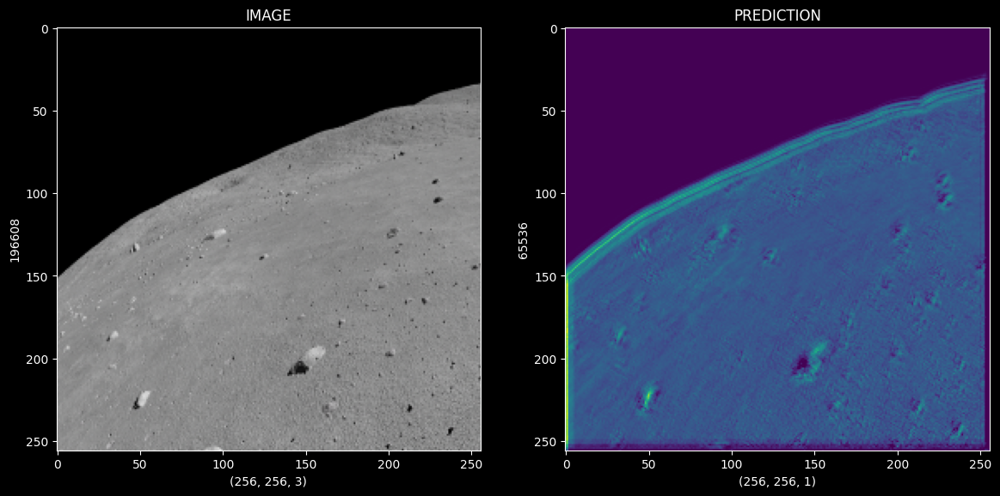

In [89]:
figure,axis = plt.subplots(1,2,figsize=(14,14))
pre_img_number = 9

Original_Img = Train_Set[pre_img_number]
Predict_Mask = Prediction_MASK_Seen[pre_img_number]

axis[0].imshow(Original_Img)
axis[0].set_xlabel(Original_Img.shape)
axis[0].set_ylabel(Original_Img.size)
axis[0].set_title("IMAGE")
axis[1].imshow(Predict_Mask)
axis[1].set_xlabel(Predict_Mask.shape)
axis[1].set_ylabel(Predict_Mask.size)
axis[1].set_title("PREDICTION")

Text(0.5, 1.0, 'PREDICTION')

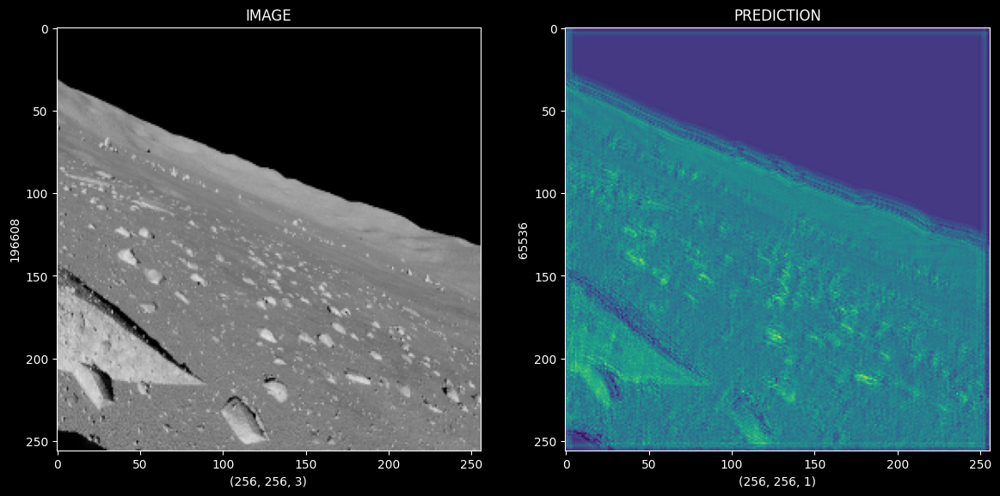

In [83]:
figure,axis = plt.subplots(1,2,figsize=(14,14))
pre_img_number = 6

Original_Img = Train_Set[pre_img_number]
Predict_Mask = Prediction_MASK_Seen[pre_img_number]

axis[0].imshow(Original_Img)
axis[0].set_xlabel(Original_Img.shape)
axis[0].set_ylabel(Original_Img.size)
axis[0].set_title("IMAGE")
axis[1].imshow(Predict_Mask)
axis[1].set_xlabel(Predict_Mask.shape)
axis[1].set_ylabel(Predict_Mask.size)
axis[1].set_title("PREDICTION")

#### MAIN PREDICTION OVERVIEW

In [84]:
Reading_IMG = cv2.cvtColor(cv2.imread("./Moon_Dataset/real_moon_images/PCAM1.png"),cv2.COLOR_BGR2RGB)
Reading_IMG = cv2.resize(Reading_IMG,(256,256))

In [85]:
print(Reading_IMG.shape)

(256, 256, 3)


In [86]:
Reading_IMG_Shape = Reading_IMG.reshape(1,Reading_IMG.shape[0],Reading_IMG.shape[1],Reading_IMG.shape[2])

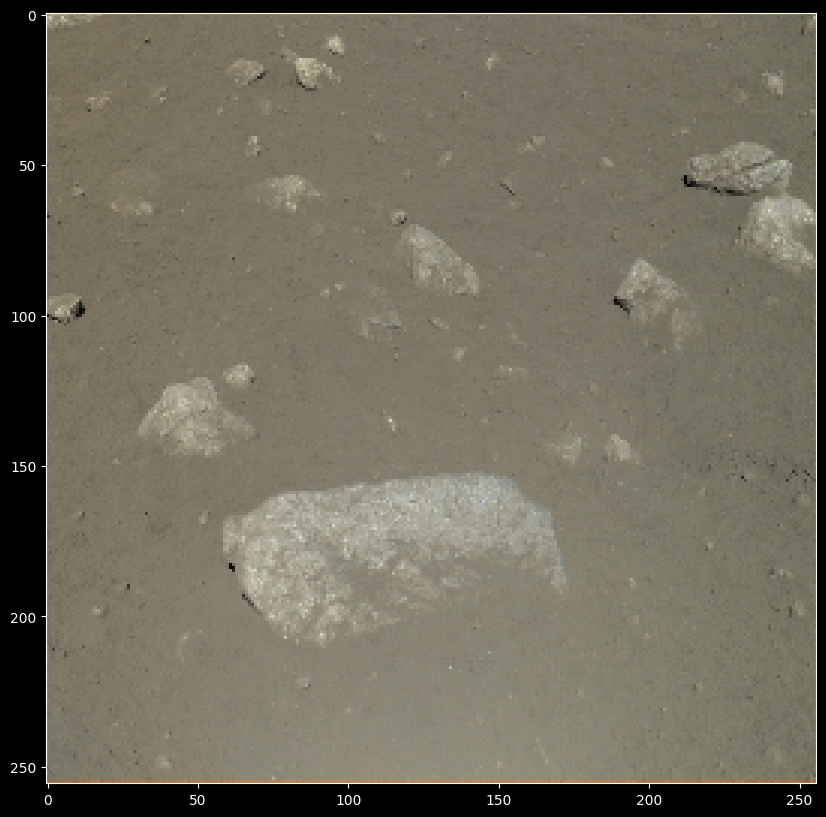

In [87]:
figure = plt.figure(figsize=(10,10))

plt.imshow(Reading_IMG)

In [88]:
MASK_Seen = Auto_Encoder.predict(Reading_IMG_Shape)

1/1 [==============================] - 0s 346ms/step


(-0.5, 255.5, 255.5, -0.5)

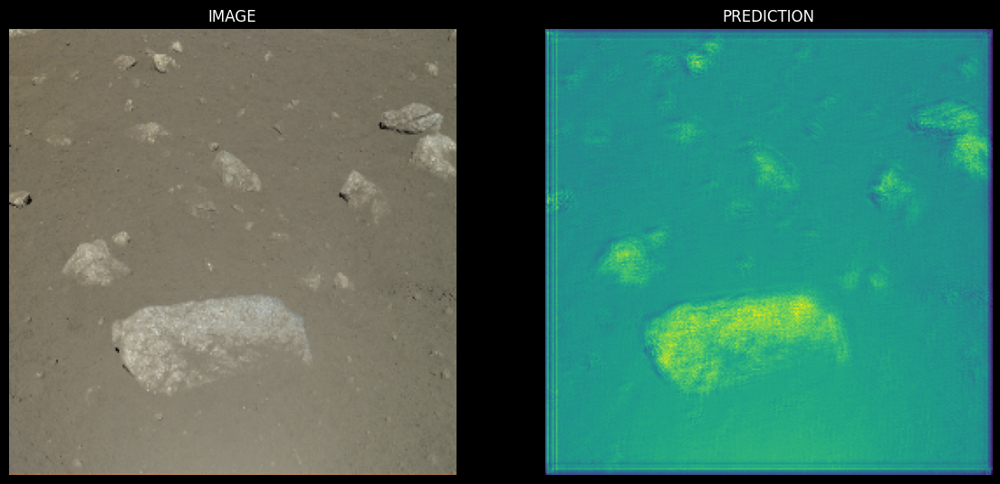

In [89]:
figure,axis = plt.subplots(1,2,figsize=(14,14))

axis[0].imshow(Reading_IMG)
axis[0].set_xlabel(Reading_IMG.shape)
axis[0].set_ylabel(Reading_IMG.size)
axis[0].set_title("IMAGE")
axis[0].axis("off")
axis[1].imshow(MASK_Seen[0])
axis[1].set_xlabel(MASK_Seen[0].shape)
axis[1].set_ylabel(MASK_Seen[0].size)
axis[1].set_title("PREDICTION")
axis[1].axis("off")

#### MAIN PREDICTION

In [90]:
Real_Lunar_Photos = Path("./Moon_Dataset/real_moon_images/")
List_Real_Photos = list(Real_Lunar_Photos.glob(r"*.png"))

In [91]:
print(List_Real_Photos[1])

Moon_Dataset\real_moon_images\g_PCAM10.png


In [92]:
List_Real_Photos = pd.Series(List_Real_Photos,name="TARGET").astype(str)

1/1 [==============================] - 0s 435ms/step


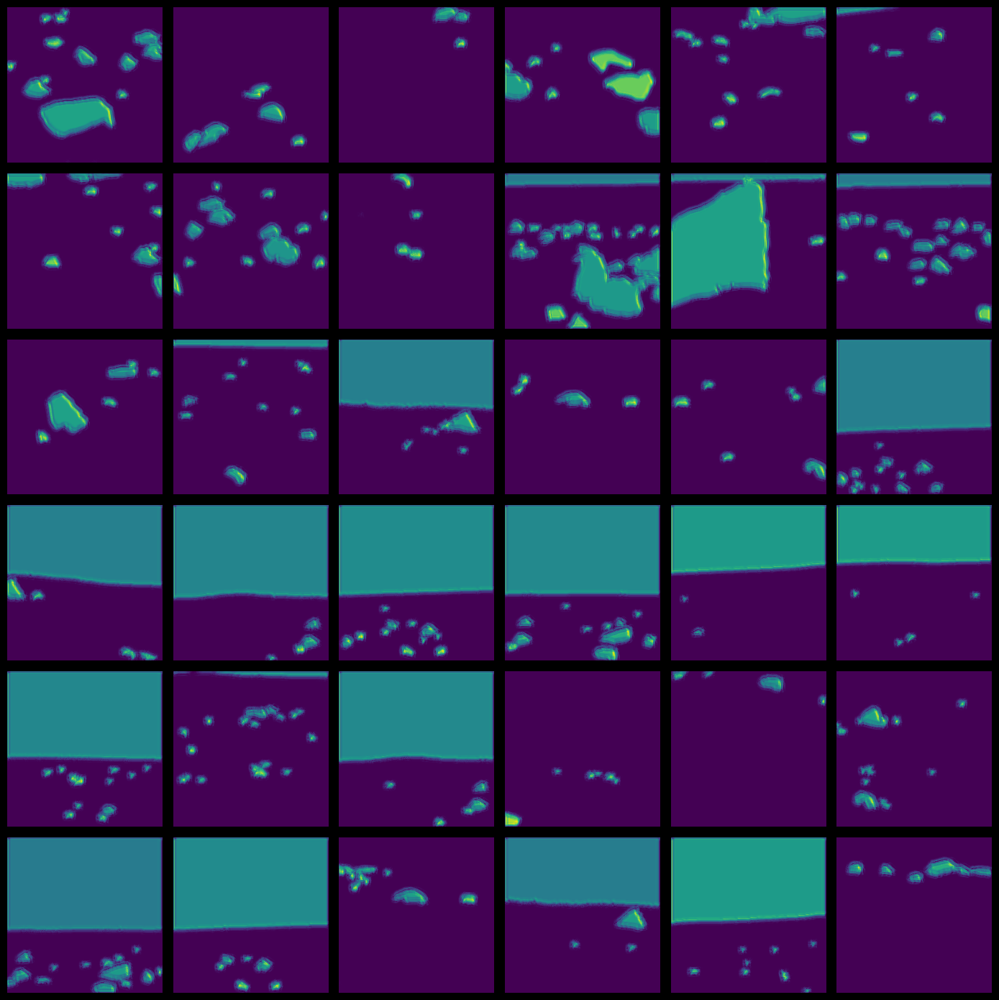

In [93]:
figure,axis = plt.subplots(6,6,figsize=(14,14))

for indexing,operations in enumerate(axis.flat):
    
    Picking_Real_IMG = List_Real_Photos[indexing]
    Reading_IMG = cv2.cvtColor(cv2.imread(Picking_Real_IMG),cv2.COLOR_BGR2RGB)
    Reading_IMG = cv2.resize(Reading_IMG,(256,256))
    Reading_IMG_Shape = Reading_IMG.reshape(1,Reading_IMG.shape[0],Reading_IMG.shape[1],Reading_IMG.shape[2])
    MASK_Prediction = Auto_Encoder.predict(Reading_IMG_Shape)
    
    operations.axis("off")
    operations.imshow(MASK_Prediction[0])

plt.tight_layout()
plt.show()

1/1 [==============================] - 0s 308ms/step


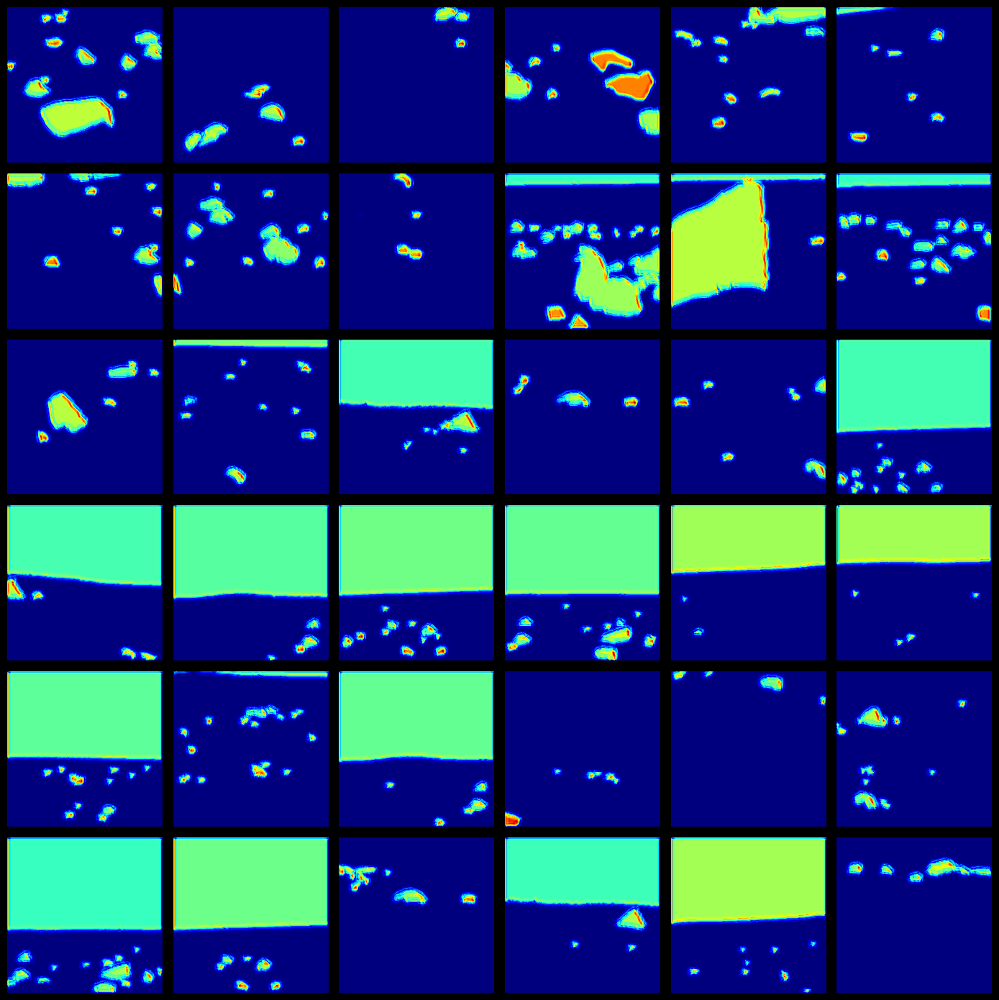

In [94]:
figure,axis = plt.subplots(6,6,figsize=(14,14))

for indexing,operations in enumerate(axis.flat):
    
    Picking_Real_IMG = List_Real_Photos[indexing]
    Reading_IMG = cv2.cvtColor(cv2.imread(Picking_Real_IMG),cv2.COLOR_BGR2RGB)
    Reading_IMG = cv2.resize(Reading_IMG,(256,256))
    Reading_IMG_Shape = Reading_IMG.reshape(1,Reading_IMG.shape[0],Reading_IMG.shape[1],Reading_IMG.shape[2])
    MASK_Prediction = Auto_Encoder.predict(Reading_IMG_Shape)
    
    operations.axis("off")
    operations.imshow(MASK_Prediction[0],cmap="jet")

plt.tight_layout()
plt.show()

1/1 [==============================] - 0s 266ms/step


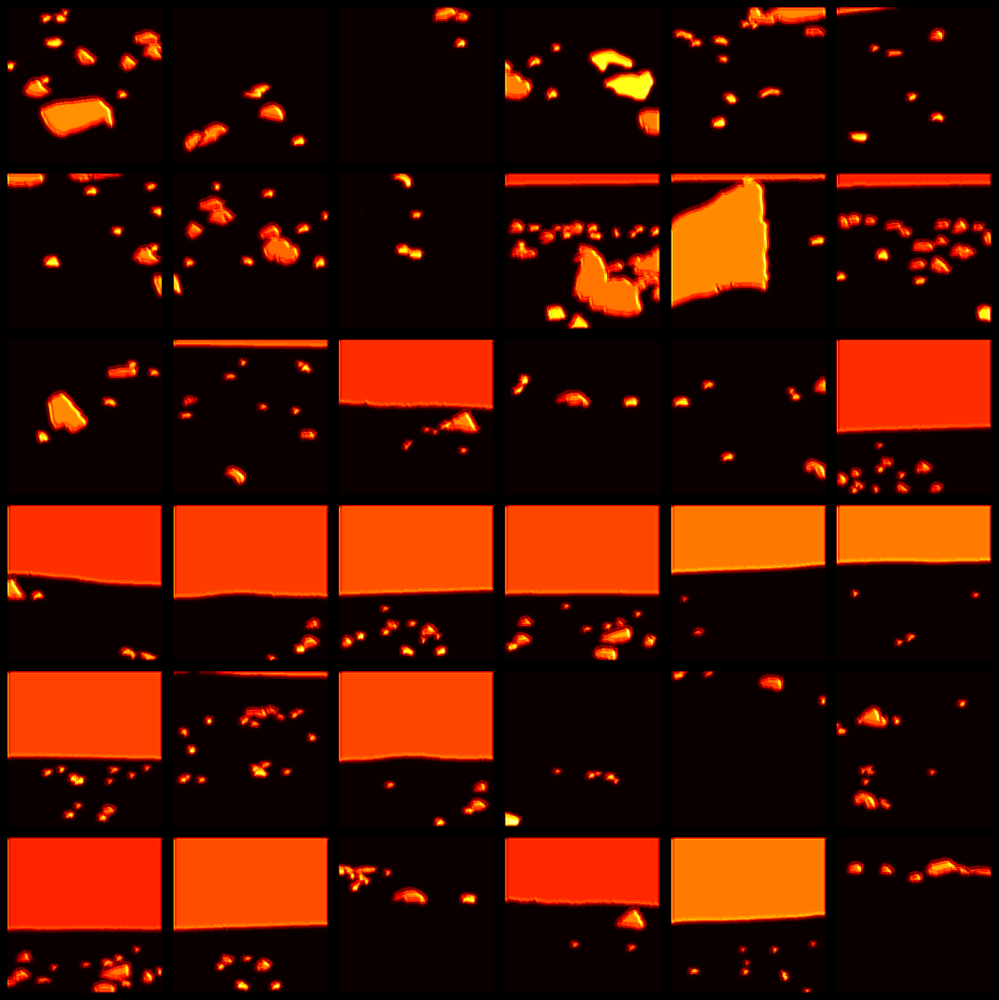

In [95]:
figure,axis = plt.subplots(6,6,figsize=(14,14))

for indexing,operations in enumerate(axis.flat):
    
    Picking_Real_IMG = List_Real_Photos[indexing]
    Reading_IMG = cv2.cvtColor(cv2.imread(Picking_Real_IMG),cv2.COLOR_BGR2RGB)
    Reading_IMG = cv2.resize(Reading_IMG,(256,256))
    Reading_IMG_Shape = Reading_IMG.reshape(1,Reading_IMG.shape[0],Reading_IMG.shape[1],Reading_IMG.shape[2])
    MASK_Prediction = Auto_Encoder.predict(Reading_IMG_Shape)
    
    operations.axis("off")
    operations.imshow(MASK_Prediction[0],cmap="hot")

plt.tight_layout()
plt.show()

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, Conv2DTranspose, BatchNormalization, ReLU
from tensorflow.keras.applications import VGG16

# Define your learning rate
learning_rate = 0.0001

# Define the loss function
compile_loss = "binary_crossentropy"

# Load the VGG16 model for feature extraction
vgg16 = VGG16(include_top=False, weights='imagenet', input_shape=(256, 256, 3))

# Encoder
e_ae = Sequential()

# Add VGG16 layers for feature extraction
for layer in vgg16.layers:
    e_ae.add(layer)
    
# Add more convolutional layers for segmentation
e_ae.add(Conv2D(128, (3, 3), padding="same"))
e_ae.add(BatchNormalization())
e_ae.add(ReLU())

# Decoder
d_ae = Sequential()

# Upsample the feature maps
d_ae.add(Conv2DTranspose(128, (3, 3), strides=(2, 2), padding="same"))
d_ae.add(ReLU())

d_ae.add(Conv2D(64, (3, 3), padding="same"))
d_ae.add(BatchNormalization())
d_ae.add(ReLU())

d_ae.add(Conv2DTranspose(64, (3, 3), strides=(2, 2), padding="same"))
d_ae.add(ReLU())

d_ae.add(Conv2D(32, (3, 3), padding="same"))
d_ae.add(BatchNormalization())
d_ae.add(ReLU())

d_ae.add(Conv2DTranspose(32, (3, 3), strides=(2, 2), padding="same"))
d_ae.add(ReLU())

d_ae.add(Conv2D(1, (3, 3), padding="same", activation='sigmoid'))

auto_encoder = Sequential([e_ae, d_ae])

# Define your optimizer with the learning rate
compile_optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)

auto_encoder.compile(loss=compile_loss, optimizer=compile_optimizer, metrics=["accuracy"])

# Now, you can use this model to train on your lunar image segmentation data
# Make sure you have a validation split or separate validation data
# Model training typically includes both training and validation data for monitoring.

# Save the entire model, including weights and architecture
auto_encoder.save("lunar_segmentation_model.h5")
